In [1]:
#---------Importing Libraries------#
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy
from scipy.io import mmread
from scipy.sparse import csr_matrix
import seaborn as sns
import os

In [2]:
#---------------Reading in Melanocyte Mapped B2C AnnData----------------#
b2c_Melano = sc.read_h5ad("/projects/b1217/HHA/Bulb_Spatial/HHA_B2C_TACCO_Melano_11_21_25.h5ad")
b2c_Melano

AnnData object with n_obs × n_vars = 401 × 17972
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'PassedFilter', 'FinalAnnotation', 'MelanoAnnotation', 'Melanocytes_I_Score', 'Melanocytes_II_Score', 'Melanocytes_III_Score'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'symbol', 'ensembl'
    uns: 'FinalAnnotation_colors', 'MelanoAnnotation_colors', 'PassedFilter_colors', 'spatial'
    obsm: 'FinalAnnotation', 'MelanoAnnotation', 'spatial', 'spatial_cropped_150_buffer'
    varm: 'FinalAnnotation', 'MelanoAnnotation'

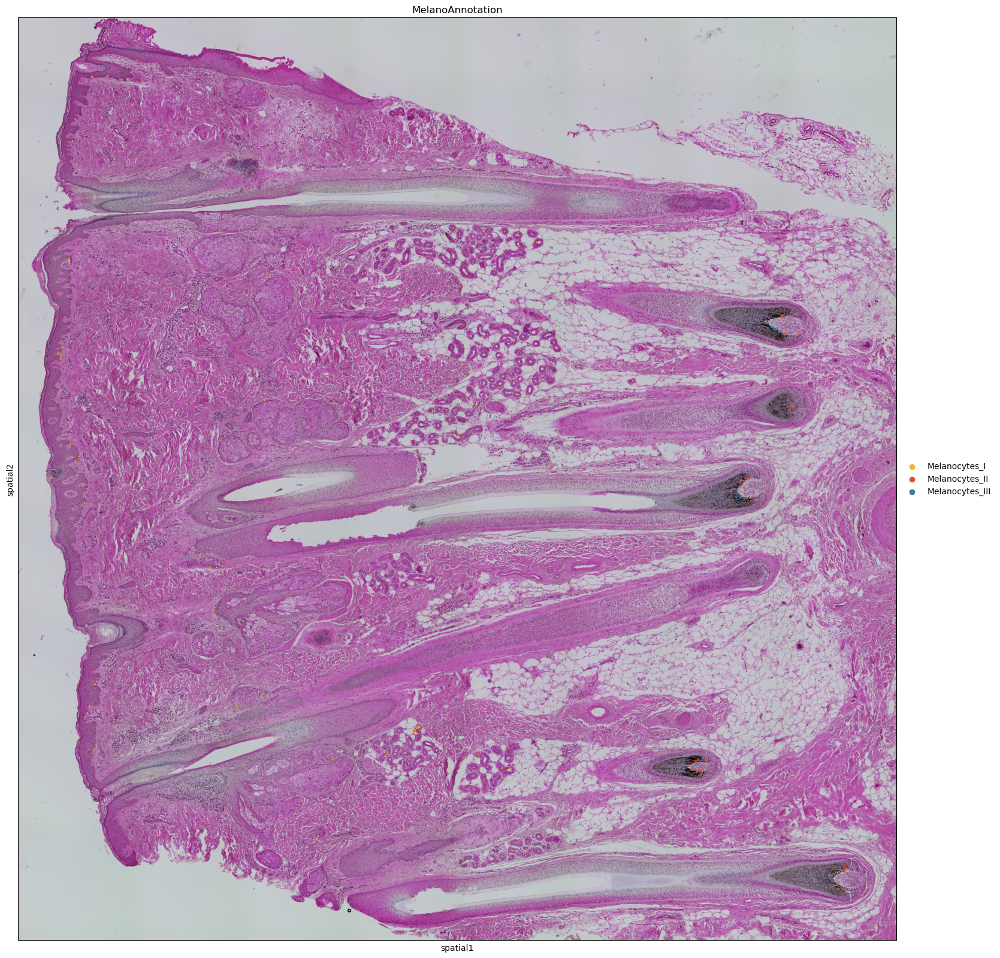

In [3]:
#--------Plotting Cells-------#
MelanoPal = {'Melanocytes_I': '#EDB931FF',
             'Melanocytes_II': '#E4502EFF',
             'Melanocytes_III': '#4378A0FF'}
#Plotting
fig, ax = plt.subplots(figsize=(20, 20))
sc.pl.spatial(b2c_Melano, color=["MelanoAnnotation"], img_key="hires", ax=ax, palette = MelanoPal)

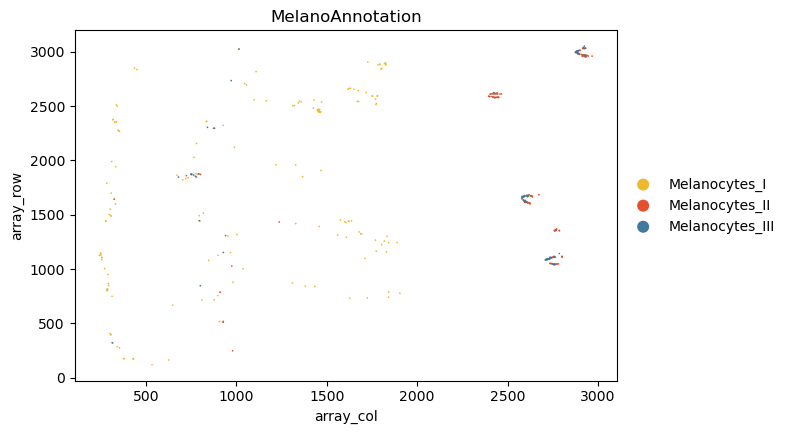

In [4]:
#----------Plotting ScatterPlot of Spatial Coordinates----------#
sc.pl.scatter(b2c_Melano, x = 'array_col', y = 'array_row',  color=["MelanoAnnotation"], size = 6)

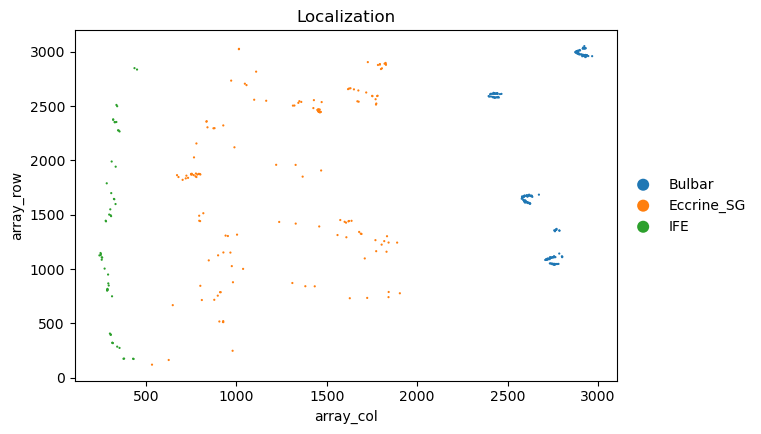

In [5]:
#-----------Labeling Epidermal And Bulbar Melanocytes----------#
#Assigning based on x axis cutoff
caselist=[(b2c_Melano.obs["array_col"] < 500, "IFE"), 
          (b2c_Melano.obs["array_col"] > 2200, "Bulbar"), 
          ((b2c_Melano.obs["array_col"] > 500) & (b2c_Melano.obs["array_col"]) < 2200, 'Eccrine_SG')]
b2c_Melano.obs["Localization"] = b2c_Melano.obs['array_col'].case_when(caselist=caselist)            

#----------Plotting Categories on Spatial Scatterplot----------#
sc.pl.scatter(b2c_Melano, x = 'array_col', y = 'array_row',  color=["Localization"], size = 10)

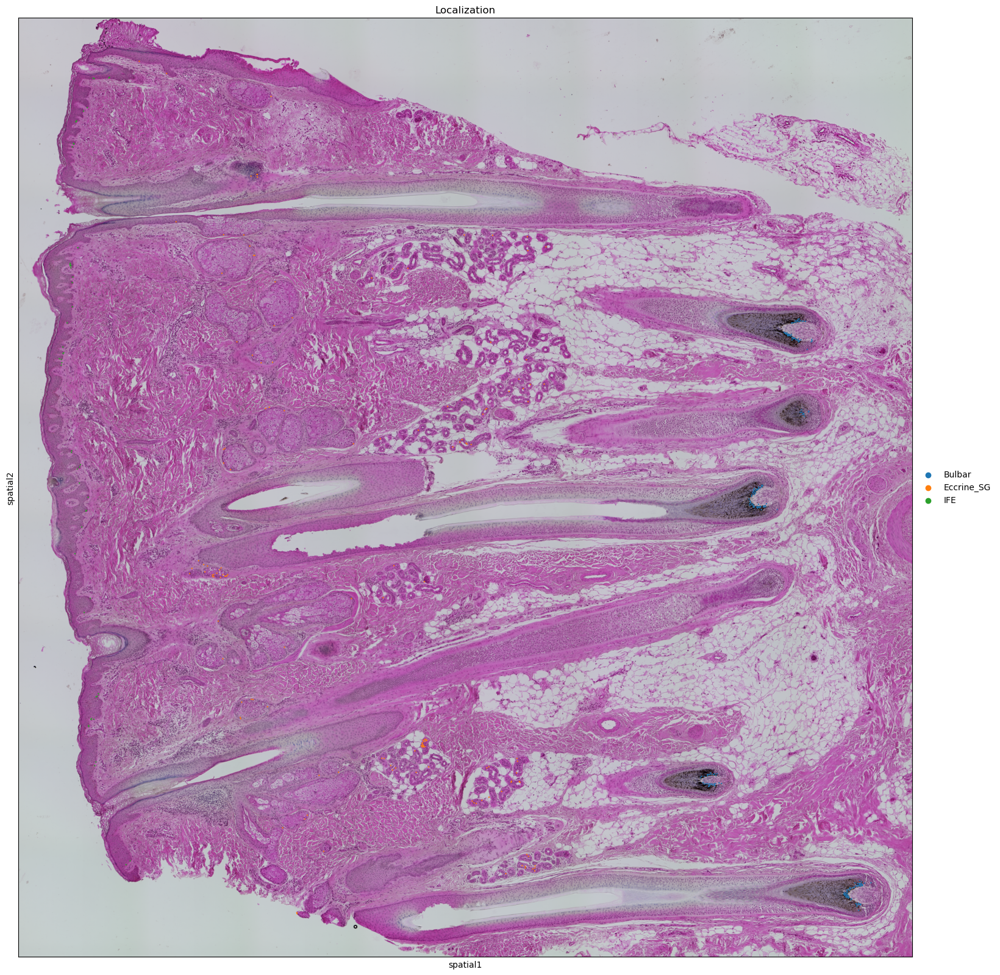

In [6]:
#--------Plotting on Spatial-------#
#Plotting
fig, ax = plt.subplots(figsize=(20, 20))
sc.pl.spatial(b2c_Melano, color=["Localization"], img_key="hires", ax=ax)

In [7]:
#---------------Writing Coordinates to CSV File-----------#
b2c_Melano.obs["Barcode"] = b2c_Melano.obs_names
b2c_Melano.obs.to_csv("/projects/b1217/HHA/Melanocyte_Plots/b2c_Melano_Metadata.csv", index = False)